In [258]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [259]:
data_frame = pd.read_csv("train.csv")
data_frame.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [260]:
data_frame.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [261]:
data_frame.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

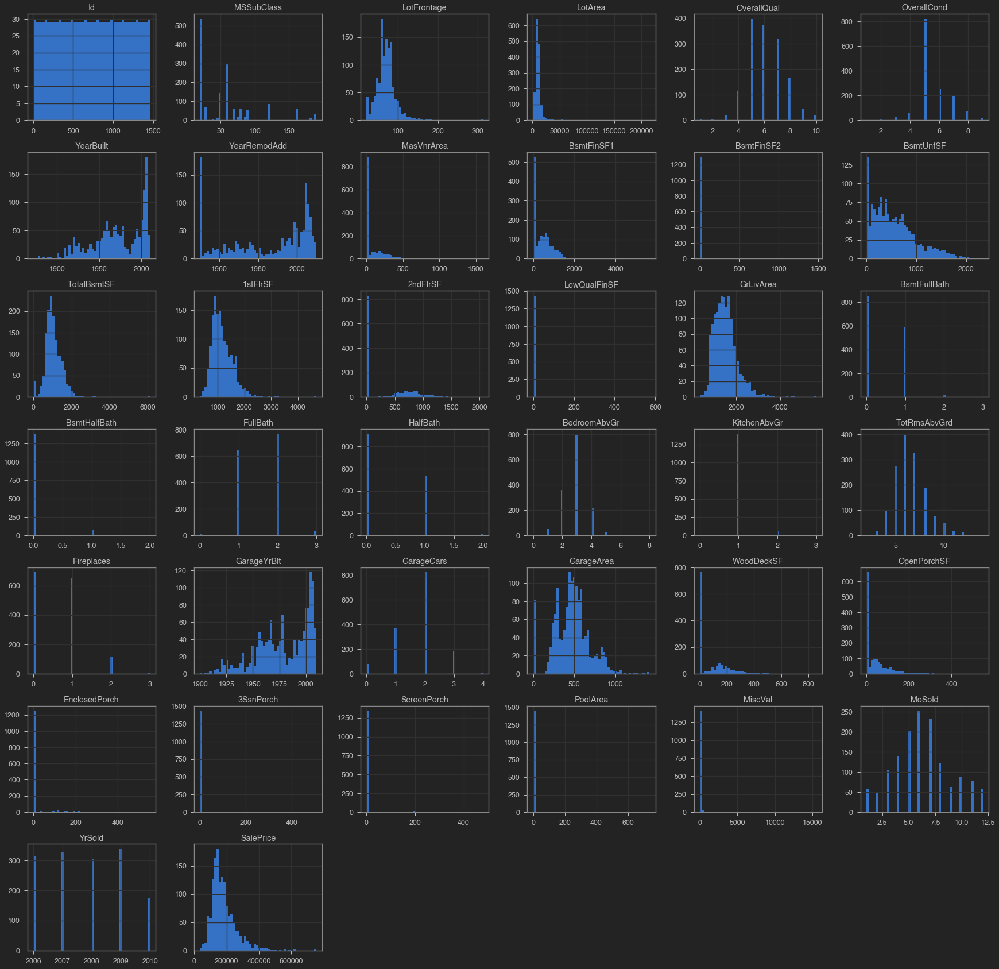

In [262]:
import matplotlib.pyplot as plt
data_frame.hist(bins=50, figsize=(30,30))
plt.show()

**Chechking for missing values**

In [263]:
#missing data
def missing_values(data_frame):
    total_values = data_frame.isna().sum().sort_values(ascending=False)
    percent = (data_frame.isna().sum()/data_frame.isna().count()).sort_values(ascending=False)
    missing_data = pd.concat([total_values, percent], axis=1, keys = ['Total', 'Percent'])
    return missing_data

In [264]:
missing_data = missing_values(data_frame)
missing_data.head(20)

,Total,Percent
PoolQC,1453,0.995205
MiscFeature,1406,0.963014
Alley,1369,0.937671
Fence,1179,0.807534
FireplaceQu,690,0.472603
LotFrontage,259,0.177397
GarageCond,81,0.055479
GarageType,81,0.055479
GarageYrBlt,81,0.055479
GarageFinish,81,0.055479


In [265]:
data_frame.drop(['PoolQC', 'MiscFeature', 'Alley', 'Fence', 'FireplaceQu', 'Id' ], axis=1, inplace=True)

In [266]:
missing_data = missing_values(data_frame)
missing_data.head(15)

,Total,Percent
LotFrontage,259,0.177397
GarageType,81,0.055479
GarageYrBlt,81,0.055479
GarageCond,81,0.055479
GarageQual,81,0.055479
GarageFinish,81,0.055479
BsmtExposure,38,0.026027
BsmtFinType2,38,0.026027
BsmtFinType1,37,0.025342
BsmtCond,37,0.025342


In [267]:
corr_matrix = data_frame.corr()

In [268]:
corr_matrix['SalePrice'].sort_values(ascending=False)

SalePrice        1.000000
OverallQual      0.790982
GrLivArea        0.708624
GarageCars       0.640409
GarageArea       0.623431
TotalBsmtSF      0.613581
1stFlrSF         0.605852
FullBath         0.560664
TotRmsAbvGrd     0.533723
YearBuilt        0.522897
YearRemodAdd     0.507101
GarageYrBlt      0.486362
MasVnrArea       0.477493
Fireplaces       0.466929
BsmtFinSF1       0.386420
LotFrontage      0.351799
WoodDeckSF       0.324413
2ndFlrSF         0.319334
OpenPorchSF      0.315856
HalfBath         0.284108
LotArea          0.263843
BsmtFullBath     0.227122
BsmtUnfSF        0.214479
BedroomAbvGr     0.168213
ScreenPorch      0.111447
PoolArea         0.092404
MoSold           0.046432
3SsnPorch        0.044584
BsmtFinSF2      -0.011378
BsmtHalfBath    -0.016844
MiscVal         -0.021190
LowQualFinSF    -0.025606
YrSold          -0.028923
OverallCond     -0.077856
MSSubClass      -0.084284
EnclosedPorch   -0.128578
KitchenAbvGr    -0.135907
Name: SalePrice, dtype: float64

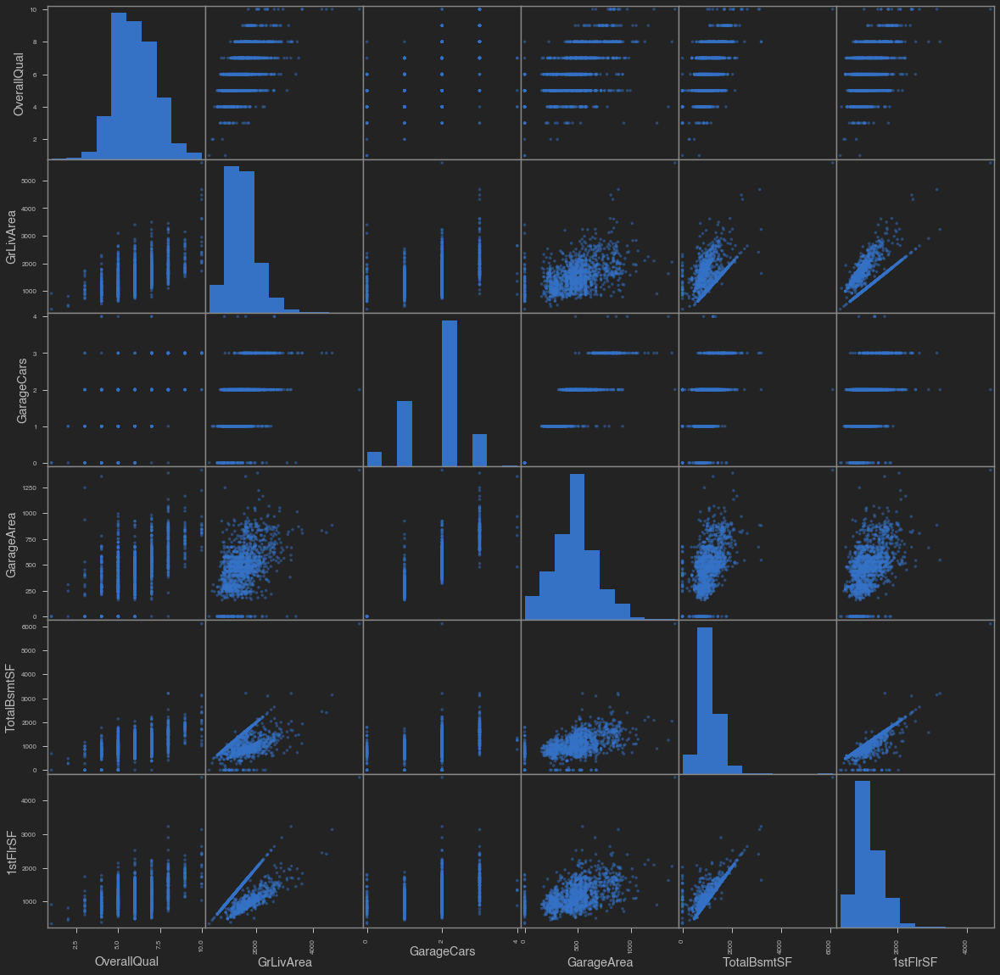

In [269]:
from pandas.plotting import scatter_matrix

attribs = ['OverallQual', 'GrLivArea', 'GarageCars', 'GarageArea','TotalBsmtSF', '1stFlrSF']

scatter_matrix(data_frame[attribs], figsize=(20,20))

plt.show()

In [270]:
n_col = data_frame._get_numeric_data().columns
cat_cols = list(set(data_frame.columns) - set(n_col))
num_cols = list(set(data_frame.columns) - set(cat_cols))

print("Numerical Columns: ", num_cols)
print("Length of Numerical Columns: ", len(num_cols))
print('\n')
print("Categorical Columns: ", cat_cols)
print("Length of Categorical Columns: ", len(cat_cols))

Numerical Columns:  ['BsmtHalfBath', 'GrLivArea', 'BedroomAbvGr', 'BsmtFinSF2', 'YearRemodAdd', 'GarageCars', 'Fireplaces', 'WoodDeckSF', 'SalePrice', 'MasVnrArea', 'MiscVal', 'GarageYrBlt', 'OverallCond', 'BsmtFullBath', 'ScreenPorch', 'BsmtUnfSF', 'OpenPorchSF', 'MoSold', 'EnclosedPorch', 'HalfBath', 'LotFrontage', 'OverallQual', 'PoolArea', 'BsmtFinSF1', 'YearBuilt', 'TotalBsmtSF', '1stFlrSF', '3SsnPorch', 'FullBath', '2ndFlrSF', 'LowQualFinSF', 'YrSold', 'LotArea', 'TotRmsAbvGrd', 'MSSubClass', 'KitchenAbvGr', 'GarageArea']
Length of Numerical Columns:  37


Categorical Columns:  ['BsmtFinType2', 'MSZoning', 'HeatingQC', 'GarageCond', 'Street', 'BldgType', 'Exterior2nd', 'Neighborhood', 'LandContour', 'PavedDrive', 'BsmtFinType1', 'Heating', 'Condition2', 'Electrical', 'GarageType', 'ExterQual', 'HouseStyle', 'MasVnrType', 'CentralAir', 'ExterCond', 'BsmtCond', 'RoofStyle', 'GarageQual', 'BsmtExposure', 'KitchenQual', 'LotConfig', 'SaleType', 'Exterior1st', 'Foundation', 'LotShape'

In [271]:
for i in range(len(num_cols)):
    if data_frame[num_cols[i]].isna().sum() > 0:
        print(num_cols[i],data_frame[num_cols[i]].isna().sum())

MasVnrArea 8
GarageYrBlt 81
LotFrontage 259


In [274]:
data_frame_num = data_frame._get_numeric_data()

data_frame_price = data_frame_num['SalePrice'].copy()

data_frame_num = data_frame_num.drop(['SalePrice'], axis=1)

# data_frame_price = data_frame_num['SalePrice'].copy()

# data_frame_num = data_frame_num.drop(['SalePrice'], axis=1)

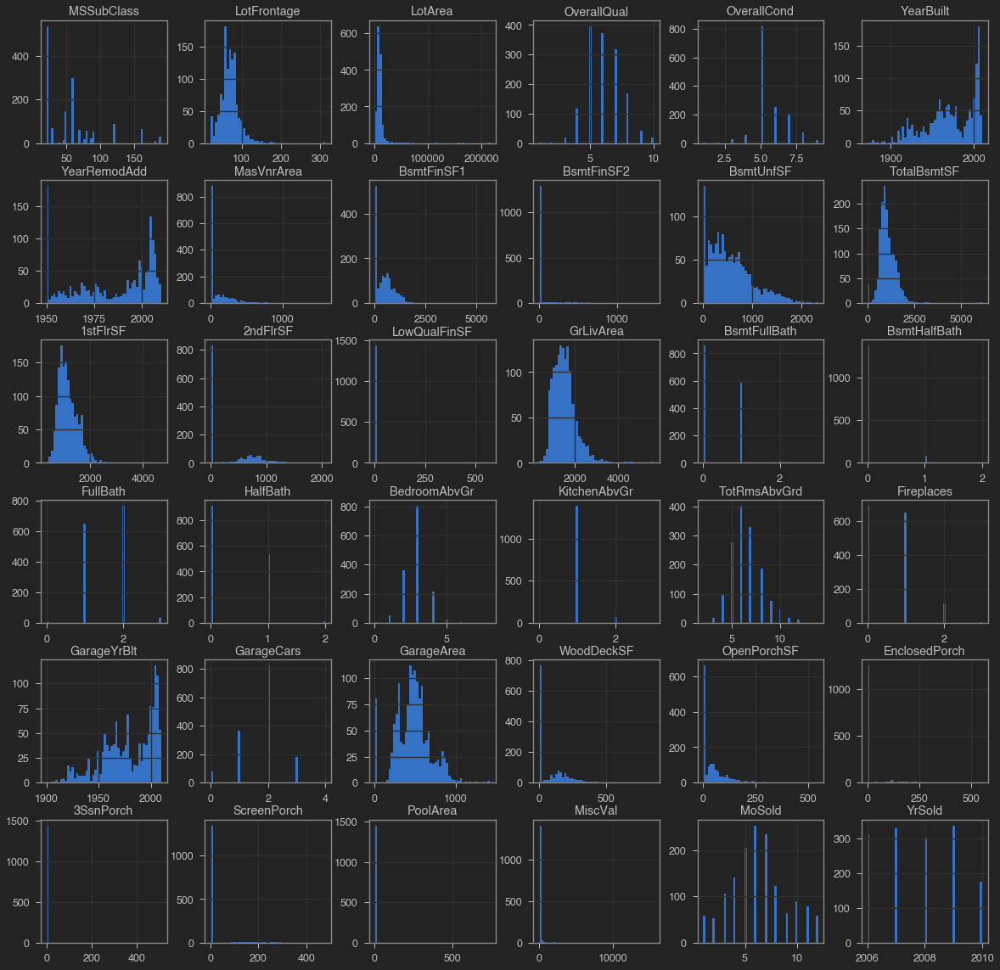

In [276]:
data_frame_num.hist(bins=50, figsize=(20,20))

plt.show()

### Numerical Cat Columns

In [277]:
data_frame_num['YrSold'].value_counts()

2009    338
2007    329
2006    314
2008    304
2010    175
Name: YrSold, dtype: int64

In [278]:
data_frame_num['Fireplaces'].value_counts()

0    690
1    650
2    115
3      5
Name: Fireplaces, dtype: int64

In [279]:
data_frame_num['HalfBath'].value_counts()

0    913
1    535
2     12
Name: HalfBath, dtype: int64

In [280]:
data_frame_num['GarageCars'].value_counts()

2    824
1    369
3    181
0     81
4      5
Name: GarageCars, dtype: int64

In [281]:
data_frame_num['FullBath'].value_counts()

2    768
1    650
3     33
0      9
Name: FullBath, dtype: int64

In [282]:
data_frame_num['TotRmsAbvGrd'].value_counts()

6     402
7     329
5     275
8     187
4      97
9      75
10     47
11     18
3      17
12     11
14      1
2       1
Name: TotRmsAbvGrd, dtype: int64

In [283]:
data_frame_num['BsmtFullBath'].value_counts()

0    856
1    588
2     15
3      1
Name: BsmtFullBath, dtype: int64

In [284]:
data_frame_num['BedroomAbvGr'].value_counts()

3    804
2    358
4    213
1     50
5     21
6      7
0      6
8      1
Name: BedroomAbvGr, dtype: int64

In [285]:
data_frame_num['OverallQual'].value_counts()

5     397
6     374
7     319
8     168
4     116
9      43
3      20
10     18
2       3
1       2
Name: OverallQual, dtype: int64

In [286]:
data_frame_num['OverallCond'].value_counts()

5    821
6    252
7    205
8     72
4     57
3     25
9     22
2      5
1      1
Name: OverallCond, dtype: int64

In [287]:
data_frame_num['MSSubClass'].value_counts()

20     536
60     299
50     144
120     87
30      69
160     63
70      60
80      58
90      52
190     30
85      20
75      16
45      12
180     10
40       4
Name: MSSubClass, dtype: int64

In [288]:
data_frame_num['MoSold'].value_counts()

6     253
7     234
5     204
4     141
8     122
3     106
10     89
11     79
9      63
12     59
1      58
2      52
Name: MoSold, dtype: int64

In [289]:
num_cat_cols = ['OverallCond', 'OverallQual', 'BedroomAbvGr',
                'BsmtFullBath', 'TotRmsAbvGrd', 'FullBath', 'GarageCars', 
               'HalfBath', 'Fireplaces']

### Removing these columns as mostly they have 0 and data is overly left skewed

In [290]:
data_frame_num['LowQualFinSF'].value_counts()

0      1434
80        3
360       2
528       1
53        1
120       1
144       1
156       1
205       1
232       1
234       1
371       1
572       1
390       1
392       1
397       1
420       1
473       1
479       1
481       1
513       1
514       1
515       1
384       1
Name: LowQualFinSF, dtype: int64

In [291]:
data_frame_num['3SsnPorch'].value_counts()

0      1436
168       3
216       2
144       2
180       2
245       1
238       1
290       1
196       1
182       1
407       1
304       1
162       1
153       1
320       1
140       1
130       1
96        1
23        1
508       1
Name: 3SsnPorch, dtype: int64

In [292]:
data_frame_num['ScreenPorch'].value_counts()

0      1344
192       6
224       5
120       5
189       4
       ... 
182       1
440       1
178       1
312       1
480       1
Name: ScreenPorch, Length: 76, dtype: int64

In [293]:
data_frame_num['PoolArea'].value_counts()

0      1453
738       1
648       1
576       1
555       1
519       1
512       1
480       1
Name: PoolArea, dtype: int64

In [294]:
data_frame_num['MiscVal'].value_counts()

0        1408
400        11
500         8
700         5
450         4
2000        4
600         4
1200        2
480         2
1150        1
800         1
15500       1
620         1
3500        1
560         1
2500        1
1300        1
1400        1
350         1
8300        1
54          1
Name: MiscVal, dtype: int64

In [295]:
data_frame_num['EnclosedPorch'].value_counts()

0      1252
112      15
96        6
120       5
144       5
       ... 
174       1
177       1
183       1
189       1
552       1
Name: EnclosedPorch, Length: 120, dtype: int64

In [296]:
data_frame_num['KitchenAbvGr'].value_counts()

1    1392
2      65
3       2
0       1
Name: KitchenAbvGr, dtype: int64

In [297]:
data_frame_num['BsmtHalfBath'].value_counts()

0    1378
1      80
2       2
Name: BsmtHalfBath, dtype: int64

In [298]:
data_frame_num['BsmtFinSF2'].value_counts()

0       1293
180        5
374        3
551        2
93         2
        ... 
532        1
544        1
546        1
547        1
1474       1
Name: BsmtFinSF2, Length: 144, dtype: int64

In [299]:
data_frame_num['2ndFlrSF'].value_counts()

0       829
728      10
504       9
672       8
546       8
       ... 
788       1
1116      1
1112      1
1111      1
1872      1
Name: 2ndFlrSF, Length: 417, dtype: int64

In [300]:
data_frame_num.drop(['BsmtFinSF2', 'BsmtHalfBath', 'KitchenAbvGr', 
                     'EnclosedPorch', 'MiscVal', 'PoolArea', 
                     'ScreenPorch', '3SsnPorch', 'LowQualFinSF', 
                     '2ndFlrSF' ], axis=1, inplace=True)

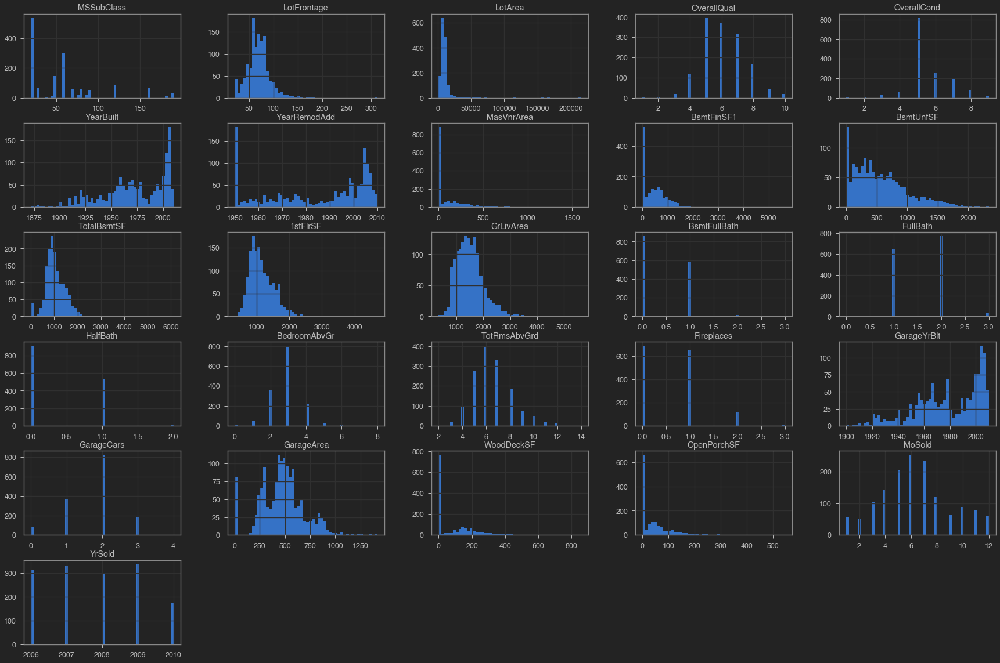

In [301]:
data_frame_num.hist(bins=50, figsize=(30,20))

plt.show()

### Adding new columns 

In [302]:
remodel = data_frame_num['YearRemodAdd'] - data_frame_num['YearBuilt'] 

In [303]:
remodel

0        0
1        0
2        1
3       55
4        0
        ..
1455     1
1456    10
1457    65
1458    46
1459     0
Length: 1460, dtype: int64

In [304]:
for i in range(len(remodel)):
    if remodel[i] != 0:
        remodel[i] = True
    else:
        remodel[i] = False

In [305]:
data_frame_num['RemodelStatus'] = remodel

In [306]:
data_frame_num['RemodelStatus'].value_counts()

False    764
True     696
Name: RemodelStatus, dtype: int64

In [307]:
houseage =  data_frame_num['YrSold'] - data_frame_num['YearRemodAdd']

In [308]:
houseage_months = []
for i in range(len(houseage)):
    x = houseage[i] * 12
    y = x + data_frame_num['MoSold'][i]
    houseage_months.append(y)

In [310]:
data_frame_num['HouseAge'] = houseage_months

In [311]:
data_frame_num.drop(['YearBuilt', 'YearRemodAdd', 'MoSold', 'YrSold'], axis=1, inplace=True)

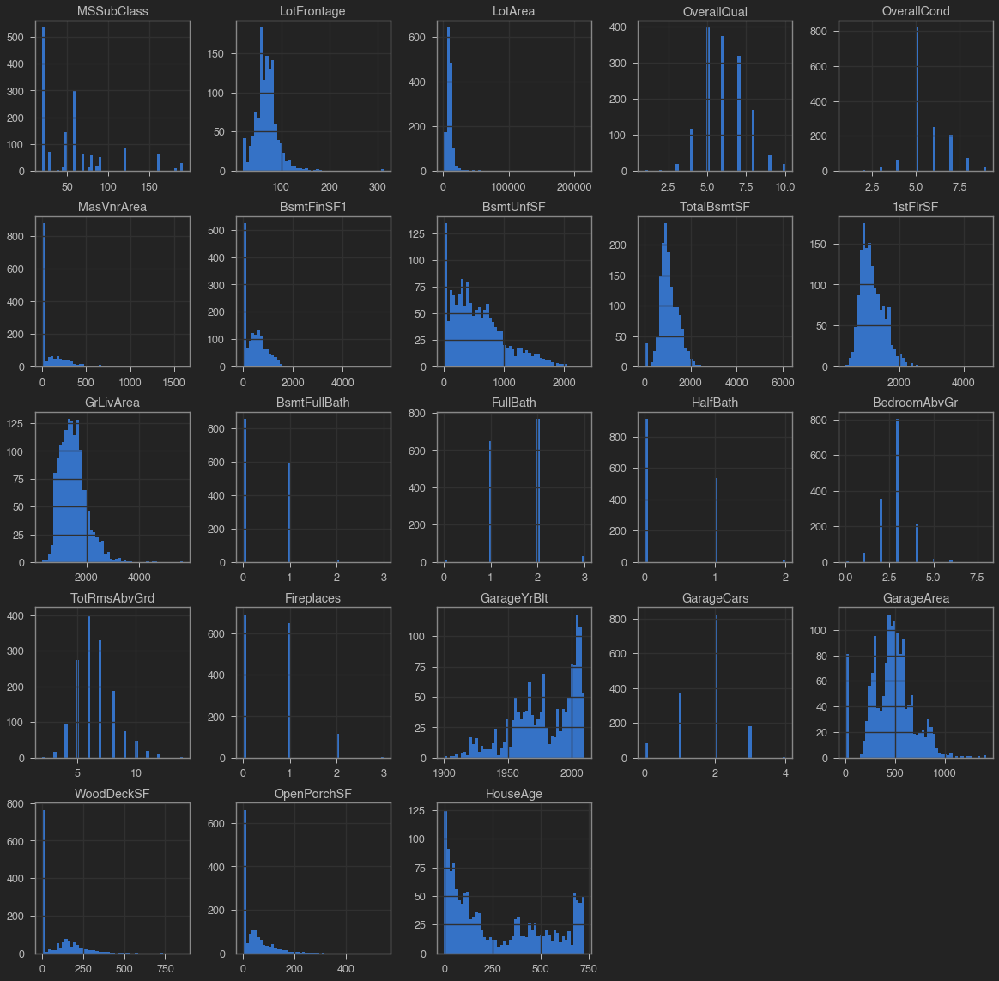

In [312]:
data_frame_num.hist(bins=50, figsize=(20,20))

plt.show()

In [313]:
num_cat_cols

['OverallCond',
 'OverallQual',
 'BedroomAbvGr',
 'BsmtFullBath',
 'TotRmsAbvGrd',
 'FullBath',
 'GarageCars',
 'HalfBath',
 'Fireplaces']

In [314]:
data_frame_pure_num = data_frame_num.copy()

In [315]:
data_frame_pure_num.drop(['OverallCond', 'OverallQual', 'BedroomAbvGr',
                         'BsmtFullBath', 'TotRmsAbvGrd', 'FullBath', 
                          'GarageCars', 'HalfBath', 'Fireplaces'], axis=1, inplace=True)

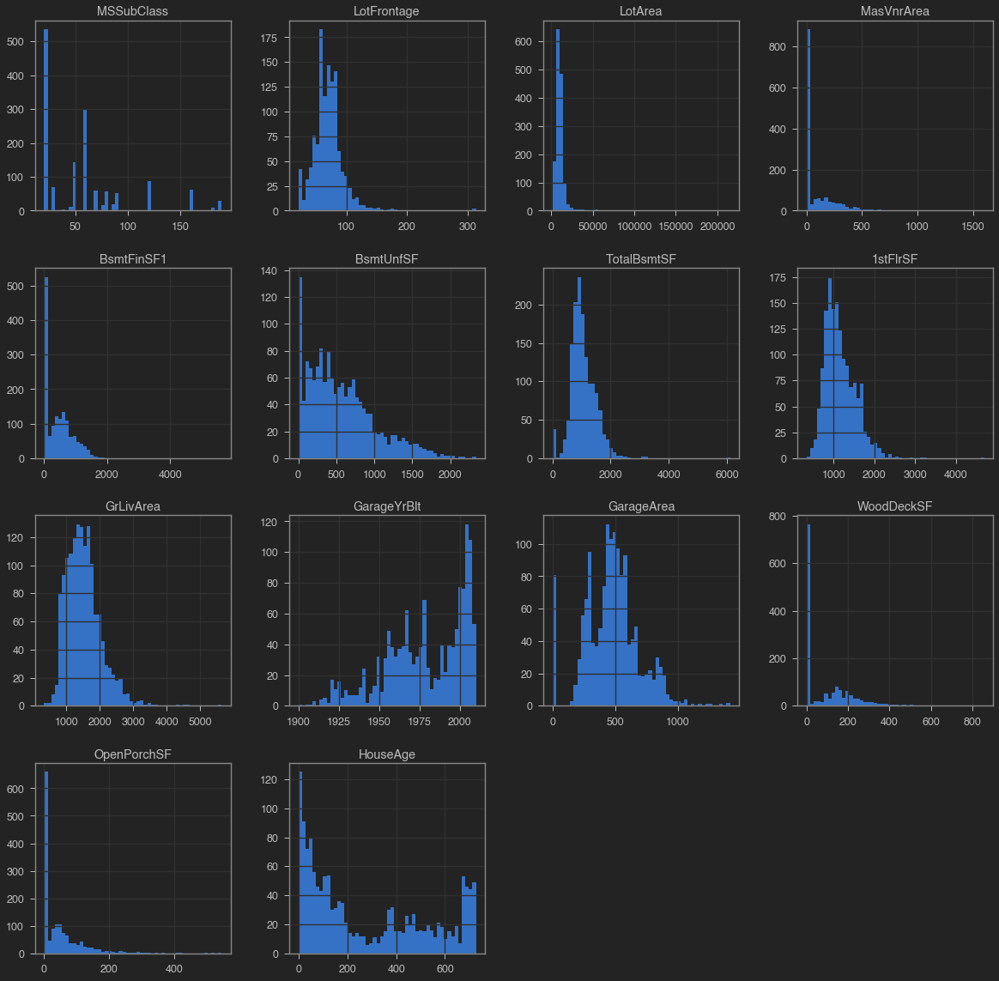

In [316]:
data_frame_pure_num.hist(bins=50, figsize=(20,20))

plt.show()

## Normalization of the data

In [317]:
from sklearn.preprocessing import StandardScaler

standardscaler = StandardScaler()

data_frame_scaled = standardscaler.fit_transform(data_frame_pure_num)

In [318]:
df_scaled = pd.DataFrame(data_frame_scaled, columns = data_frame_pure_num.columns)

df_scaled.head()

,MSSubClass,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,GrLivArea,GarageYrBlt,GarageArea,WoodDeckSF,OpenPorchSF,RemodelStatus,HouseAge
0,0.073375,-0.208034,-0.207142,0.510015,0.575425,-0.944591,-0.459303,-0.793434,0.370333,0.992426,0.351000,-0.752176,0.216503,-0.954460,-0.887642
1,-0.872563,0.409895,-0.091886,-0.572835,1.171992,-0.641228,0.466465,0.257140,-0.482512,-0.101543,-0.060731,1.626195,-0.704483,-0.954460,0.384909
2,0.073375,-0.084449,0.073480,0.322174,0.092907,-0.301643,-0.313369,-0.627826,0.515013,0.911391,0.631726,-0.752176,-0.070361,1.047712,-0.810885
3,0.309859,-0.414011,-0.096897,-0.572835,-0.499274,-0.061670,-0.687324,-0.521734,0.383659,0.789839,0.790804,-0.752176,-0.176048,1.047712,0.615180
4,0.073375,0.574676,0.375148,1.360826,0.463568,-0.174865,0.199680,-0.045611,1.299326,0.870874,1.698485,0.780197,0.563760,-0.954460,-0.701809


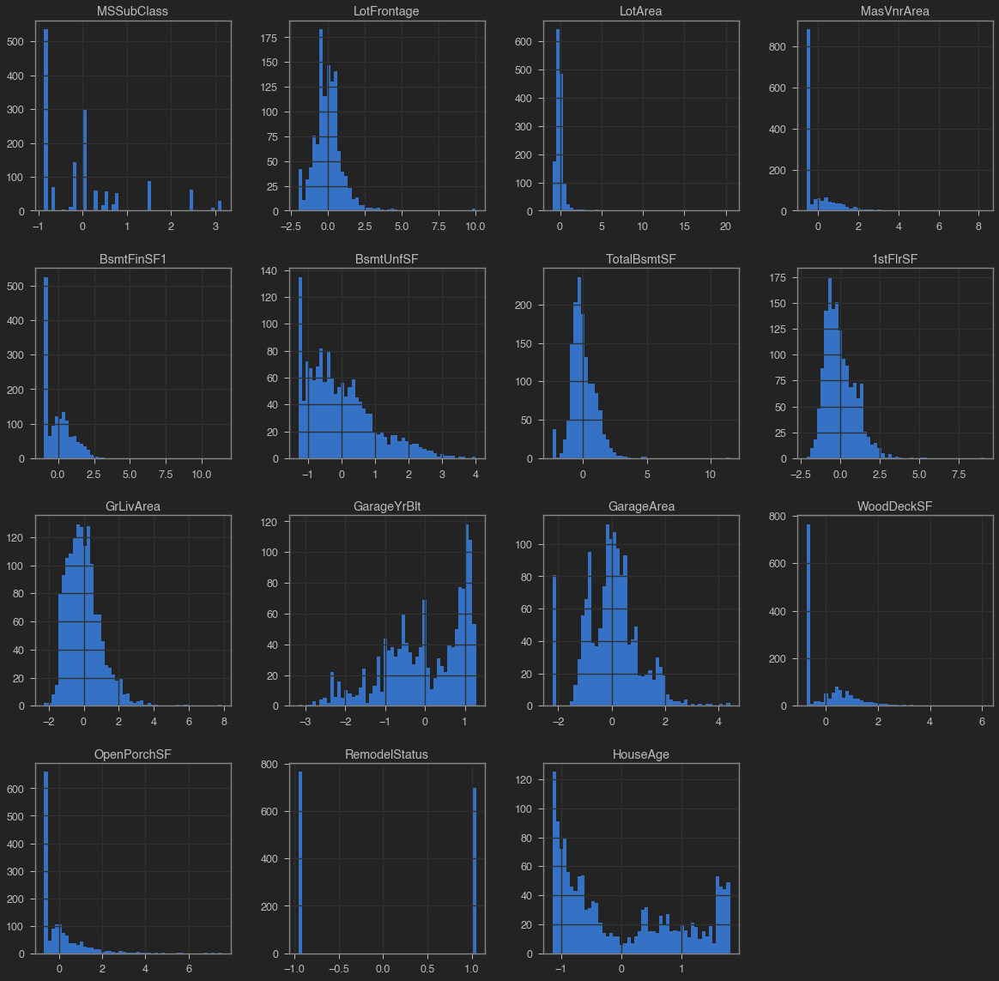

In [319]:
df_scaled.hist(bins = 50, figsize=(20,20))

plt.show()

### Trying MinMax Scaler

In [321]:
from sklearn.preprocessing import MinMaxScaler

minmax = MinMaxScaler()

df_scaled_minmax = minmax.fit_transform(data_frame_pure_num)

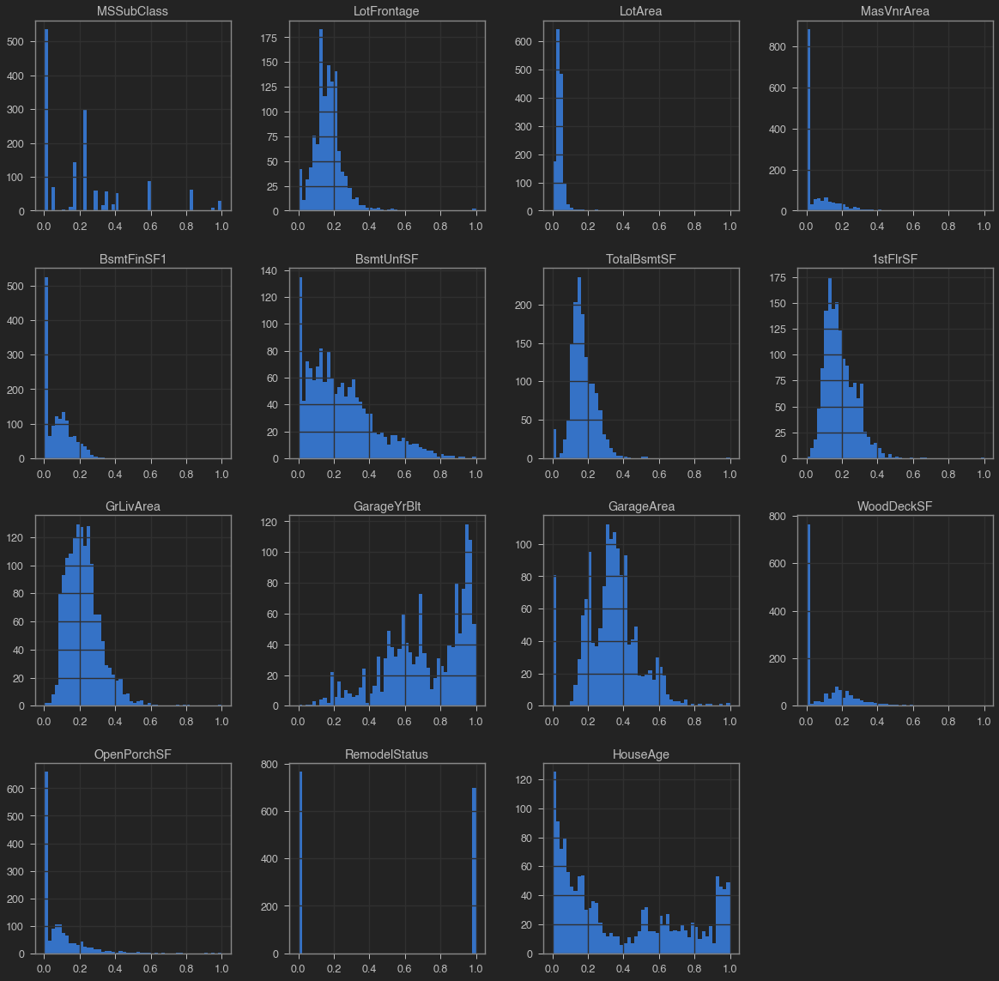

In [322]:
df_scaled_minmax = pd.DataFrame(df_scaled_minmax, columns= data_frame_pure_num.columns)

df_scaled_minmax.hist(bins=50, figsize = (20,20))

plt.show()

count    1201.000000
mean       70.049958
std        24.284752
min        21.000000
25%        59.000000
50%        69.000000
75%        80.000000
max       313.000000
Name: LotFrontage, dtype: float64


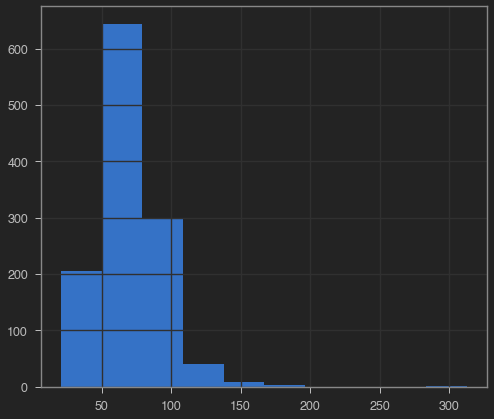

In [19]:
data_frame_num['LotFrontage'].hist(bins=10)

print(data_frame_num['LotFrontage'].describe())

count    1379.000000
mean     1978.506164
std        24.689725
min      1900.000000
25%      1961.000000
50%      1980.000000
75%      2002.000000
max      2010.000000
Name: GarageYrBlt, dtype: float64


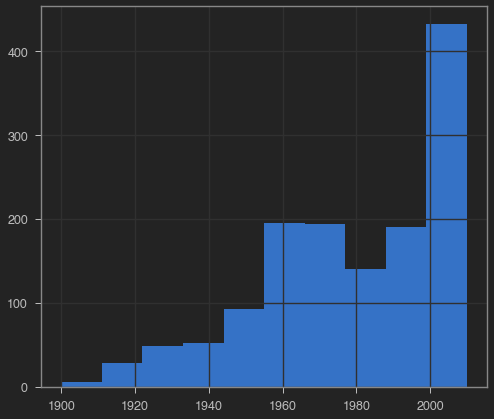

In [20]:
data_frame_num['GarageYrBlt'].hist(bins=10)

print(data_frame_num['GarageYrBlt'].describe())

count    1452.000000
mean      103.685262
std       181.066207
min         0.000000
25%         0.000000
50%         0.000000
75%       166.000000
max      1600.000000
Name: MasVnrArea, dtype: float64


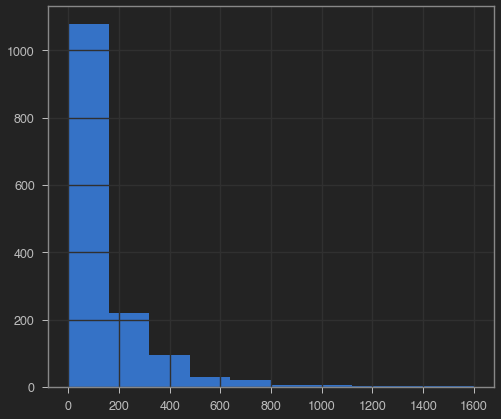

In [21]:
data_frame_num['MasVnrArea'].hist(bins=10)

print(data_frame_num['MasVnrArea'].describe())

In [52]:
from sklearn.impute import SimpleImputer

imputer = SimpleImputer(strategy = 'median')

In [53]:
imputer.fit(data_frame_num['LotFrontage'].values.reshape(-1, 1))

SimpleImputer(strategy='median')

In [54]:
data_frame_num['MedianLotFrontage'] = imputer.transform(data_frame_num['LotFrontage'].values.reshape(-1, 1))

In [55]:
data_frame_num['MedianLotFrontage'].describe()

count    1460.000000
mean       69.863699
std        22.027677
min        21.000000
25%        60.000000
50%        69.000000
75%        79.000000
max       313.000000
Name: MedianLotFrontage, dtype: float64

In [56]:
data_frame_num['LotFrontage'].describe()

count    1201.000000
mean       70.049958
std        24.284752
min        21.000000
25%        59.000000
50%        69.000000
75%        80.000000
max       313.000000
Name: LotFrontage, dtype: float64

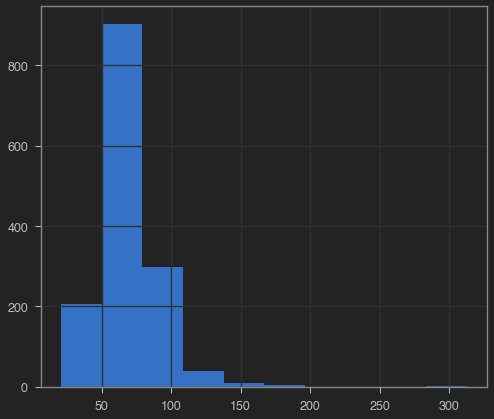

In [57]:
data_frame_num['MedianLotFrontage'].hist(bins = 10)

In [58]:
# data_frame_num.boxplot(figsize = (30,30))

In [30]:
data_frame_num['OverallQual'].groupby('SalePrice').hist()

KeyError: 'SalePrice'

In [59]:
from pandas.plotting import scatter_matrix
scatter_matrix(data_frame_num, alpha=0.2, figsize=(300,200), diagonal='kde')
plt.show()

## Base Model

In [ ]:
imputer.fit(data_frame_num)

In [ ]:
imputer.statistics_

In [ ]:
num_x = imputer.transform(data_frame_num)

In [ ]:
num_train_x = pd.DataFrame(num_x, columns = data_frame_num.columns)

num_train_x.head()

In [ ]:
num_train_x.isna().sum()

In [ ]:
num_